In [1]:
from utils import load_data_geo

In [2]:
# Basic plots
%matplotlib inline
# Common imports and settings
import os
import sys

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Markdown

# plt.rcParams['figure.figsize'] = [12, 8]

pd.set_option("display.max_rows", None)
# Datacube
import datacube
import xarray as xr
from datacube.utils import masking
from datacube.utils.cog import write_cog
from datacube.utils.rio import configure_s3_access
from deafrica_tools.classification import collect_training_data, predict_xr
from deafrica_tools.datahandling import mostcommon_crs, load_ard
from deafrica_tools.areaofinterest import define_area

# https://github.com/GeoscienceAustralia/dea-notebooks/tree/develop/Tools
from deafrica_tools.plotting import display_map, rgb, map_shapefile
from odc.io.cgroups import get_cpu_quota
import geopandas as gpd
from datacube.utils.geometry import CRS, Geometry
from deafrica_tools.plotting import rgb
from deafrica_tools.bandindices import calculate_indices

In [3]:
from datacube.utils.aws import configure_s3_access

configure_s3_access(aws_unsigned=False, requester_pays=True)

In [4]:
# region_path = "train/Soc Trang_Traning.shp"
region_path = "region/ST_region.shp"

In [6]:
region = load_data_geo(region_path)

In [7]:
region.head()

,ID_Reg,Regions,ID_Pro,Province,ID_Dis,District,ID_Com,Commune,merge,geometry
0,8.0,MKD,94,Soc Trang,941,Soc Trang City,31513,Ward 1,Soc Trang-Soc Trang City-Ward 1,"POLYGON Z ((105.87486 9.26280 0.00000, 105.873..."


In [8]:
region.explore(column="ID_Pro", legend=False)
# region.explore(column="Name", legend=False)

In [9]:
train_path = "train/Soc Trang_Traning.shp"
train = load_data_geo(train_path)
train.head()

,Name,geometry
0,Water1,POINT (620223.628 1072681.101)
1,Water1,POINT (621057.521 1071074.602)
2,Water1,POINT (621891.602 1069430.621)
3,Water1,POINT (622762.564 1068048.689)
4,Water1,POINT (623256.484 1066777.765)


In [10]:
train.explore(column="Name", legend=True)

In [11]:
dc = datacube.Datacube(app='crop_health_evi')

In [12]:
geopolygon = gpd.read_file(region_path)

In [13]:
gdf = gpd.read_file(region_path)
lat_range = (gdf.total_bounds[1], gdf.total_bounds[3])
lon_range = (gdf.total_bounds[0], gdf.total_bounds[2])

In [14]:
display_map(x=lon_range, y=lat_range)

In [15]:
query = {
    'x': lon_range,
    'y': lat_range,
    'time': ("2022-01-01", "2022-12-31"),
    'resolution': (-10, 10),
    # "output_crs": output_crs,
}
query

{'x': (105.54366239999999, 106.33510295999999),
 'y': (9.243697679999999, 9.93806676),
 'time': ('2022-01-01', '2022-12-31'),
 'resolution': (-10, 10)}

In [16]:
# query = {
#     'x': lon_range,
#     'y': lat_range,
#     'time': ("2022-01-01", "2022-02-01"),
#     # "measurements": ['red', 'green', 'blue', 'nir'],
#     'resolution': (-10, 10),
# }
# ds1 = load_ard(dc=dc,
#               products=['s2_l2a'],
#               min_gooddata=0.99,
#               measurements=['red', 'green', 'blue', 'nir'],
#               output_crs=output_crs, 
#               **query)

In [17]:
import time
t_time = time.time()
query = {
    'x': lon_range,
    'y': lat_range,
    'time': ("2022-01-01", "2022-02-01"),
    "measurements": ['red', 'green', 'blue', 'nir'],
    'resolution': (-10, 10),
}
output_crs = mostcommon_crs(dc=dc, product='s2_l2a', query=query)
query["output_crs"] = output_crs
ds = dc.load(product="s2_l2a", group_by='solar_day', **query)
print(time.time() - t_time)

999.5558435916901


In [18]:
display(ds)

<xarray.Dataset>
Dimensions:      (time: 12, y: 7702, x: 8707)
Coordinates:
  * time         (time) datetime64[ns] 2022-01-02T03:25:18.223000 ... 2022-02...
  * y            (y) float64 1.099e+06 1.099e+06 ... 1.022e+06 1.022e+06
  * x            (x) float64 5.596e+05 5.596e+05 ... 6.466e+05 6.467e+05
    spatial_ref  int32 32648
Data variables:
    red          (time, y, x) uint16 0 0 0 0 0 0 ... 1471 1481 1428 1413 1407
    green        (time, y, x) uint16 0 0 0 0 0 0 ... 1868 1915 1888 1844 1824
    blue         (time, y, x) uint16 0 0 0 0 0 0 ... 1719 1740 1734 1687 1638
    nir          (time, y, x) uint16 0 0 0 0 0 0 ... 1148 1171 1178 1156 1120
Attributes:
    crs:           EPSG:32648
    grid_mapping:  spatial_ref

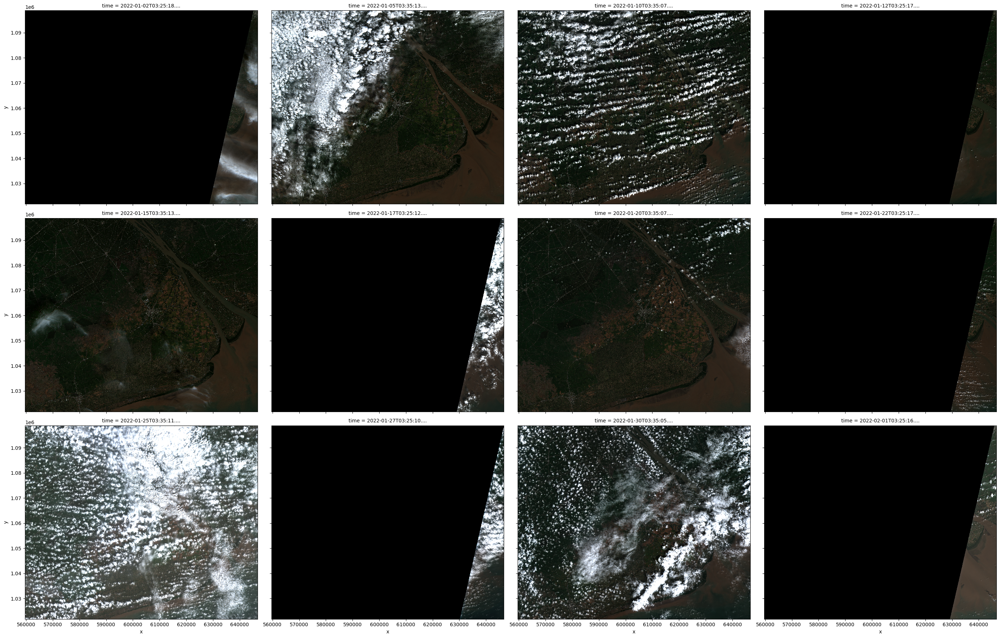

In [19]:
rgb(ds, col="time")

In [20]:
ds = calculate_indices(ds, index='NDVI', satellite_mission='s2')

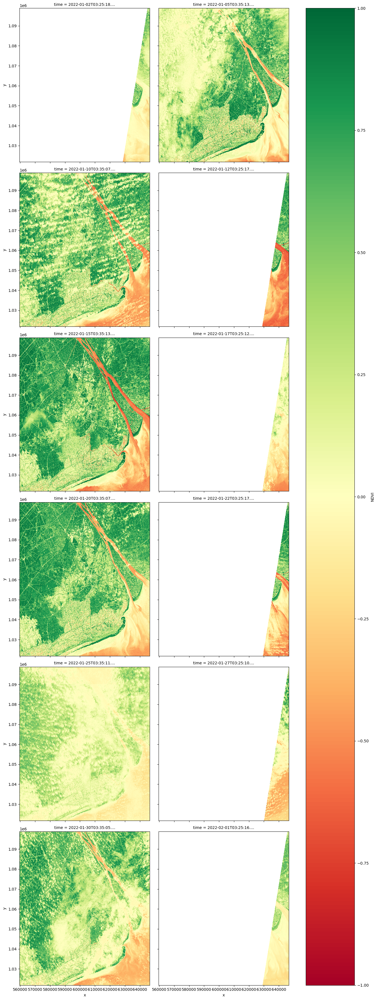

In [21]:
ds.NDVI.plot(col='time',
           cmap='RdYlGn',
           size=6,
col_wrap=2)

In [22]:
display(ds)

<xarray.Dataset>
Dimensions:      (time: 12, y: 7702, x: 8707)
Coordinates:
  * time         (time) datetime64[ns] 2022-01-02T03:25:18.223000 ... 2022-02...
  * y            (y) float64 1.099e+06 1.099e+06 ... 1.022e+06 1.022e+06
  * x            (x) float64 5.596e+05 5.596e+05 ... 6.466e+05 6.467e+05
    spatial_ref  int32 32648
Data variables:
    red          (time, y, x) uint16 0 0 0 0 0 0 ... 1471 1481 1428 1413 1407
    green        (time, y, x) uint16 0 0 0 0 0 0 ... 1868 1915 1888 1844 1824
    blue         (time, y, x) uint16 0 0 0 0 0 0 ... 1719 1740 1734 1687 1638
    nir          (time, y, x) uint16 0 0 0 0 0 0 ... 1148 1171 1178 1156 1120
    NDVI         (time, y, x) float64 nan nan nan nan ... -0.09593 -0.1 -0.1136
Attributes:
    crs:           EPSG:32648
    grid_mapping:  spatial_ref

In [23]:
import rasterio
from rasterio import features
from rasterio.transform import from_origin

In [58]:
crs = ds.crs
top_left_x = 9.9323  # Tọa độ x góc trên bên trái 9.9323 105.5484
top_left_y = 105.5484  # Tọa độ y góc trên bên trái
x_resolution = 0.001  # Độ phân giải x
y_resolution = -0.001 

In [59]:
ls_time = ds.NDVI.shape[0]

In [60]:
for i in range(ls_time):
    ndvi_data = ds.NDVI[i]
    with rasterio.open(
    f"/home/jovyan/example/test/tools/test_{i}.tiff",
    'w',
    driver='GTiff',
    height=ndvi_data.shape[0],
    width=ndvi_data.shape[1],
    count=1,  # Số lượng tầng dữ liệu (1 cho NDVI)
    dtype=rasterio.float32,
    crs=crs,  # Thay thế với mã EPSG thích hợp
    transform=from_origin(top_left_x, top_left_y, x_resolution, y_resolution)
    ) as dst:
        dst.write(ndvi_data, 1)

In [61]:
p = "/home/jovyan/example/test/tools/"
path_tiff = [p + f"test_{i}.tiff" for i in range(ls_time)]

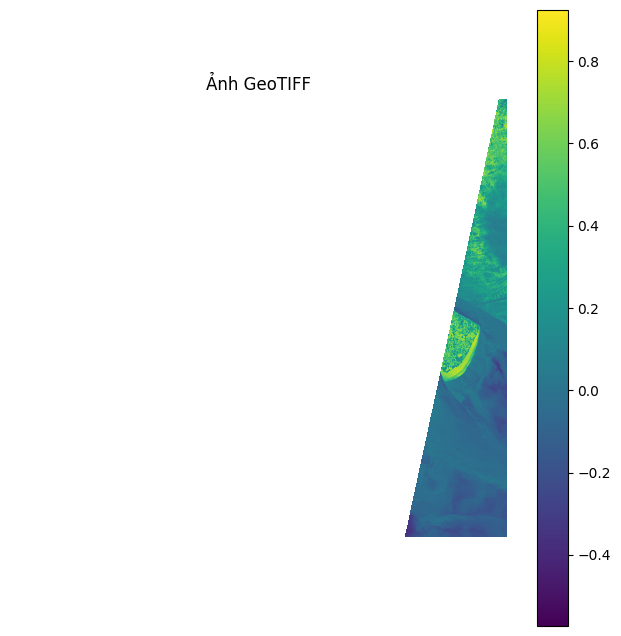

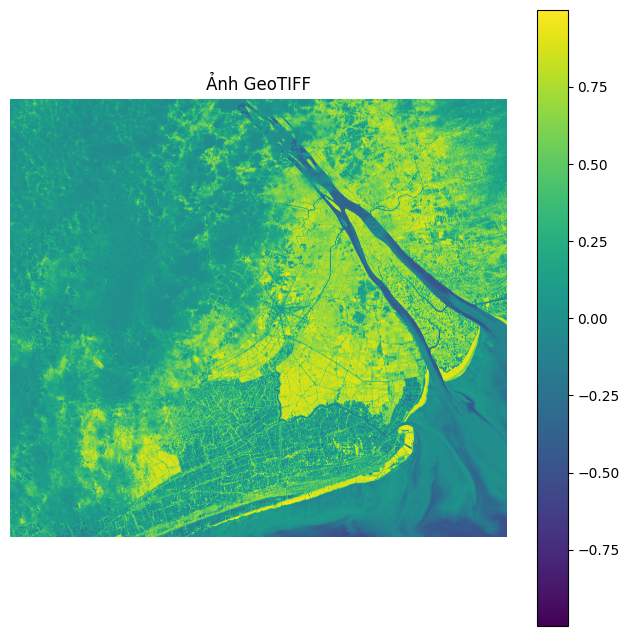

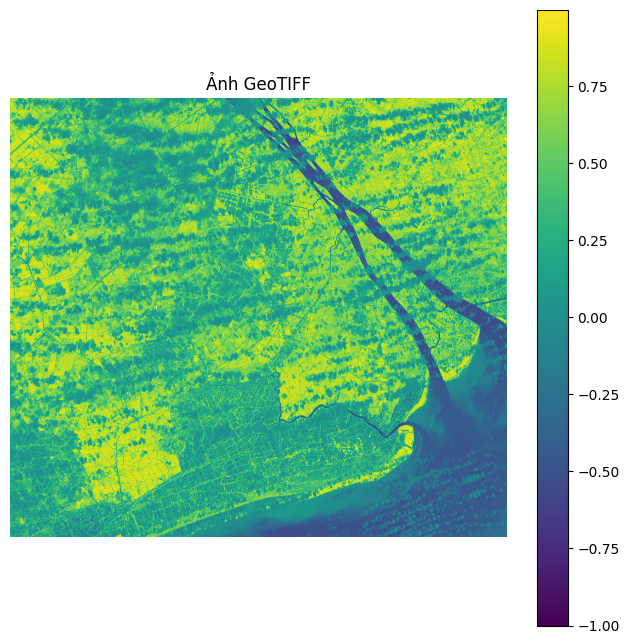

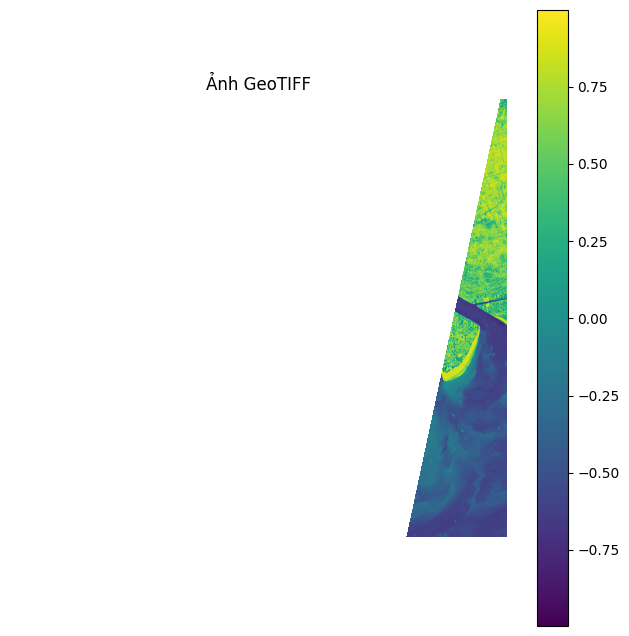

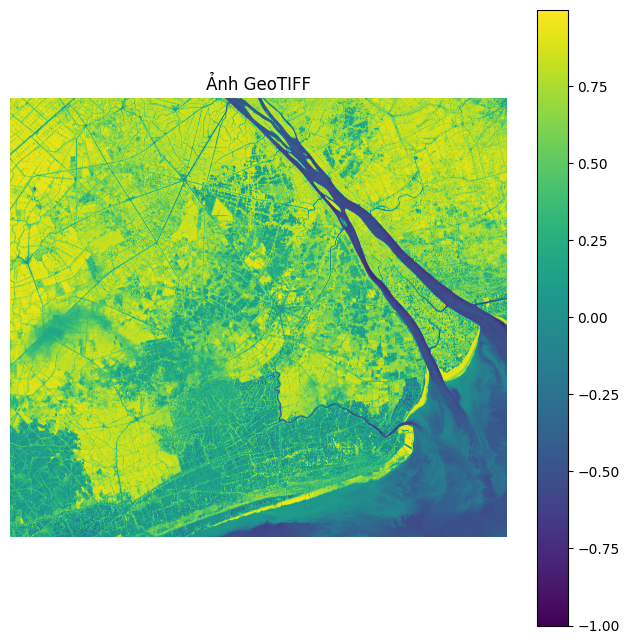

...

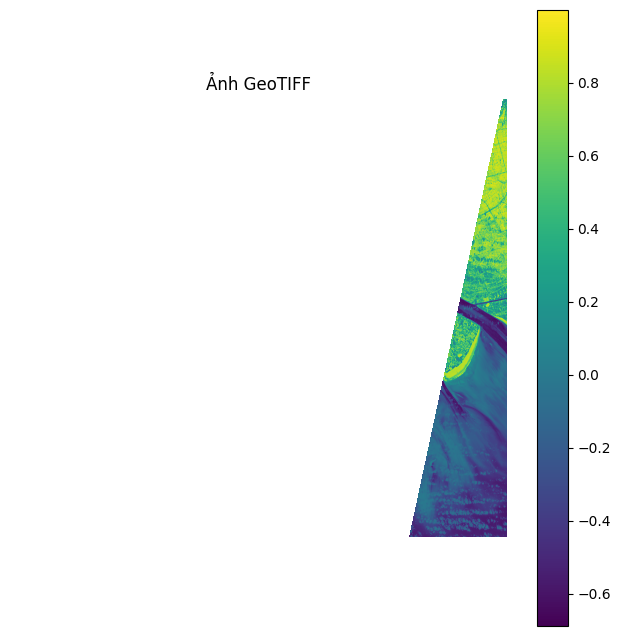

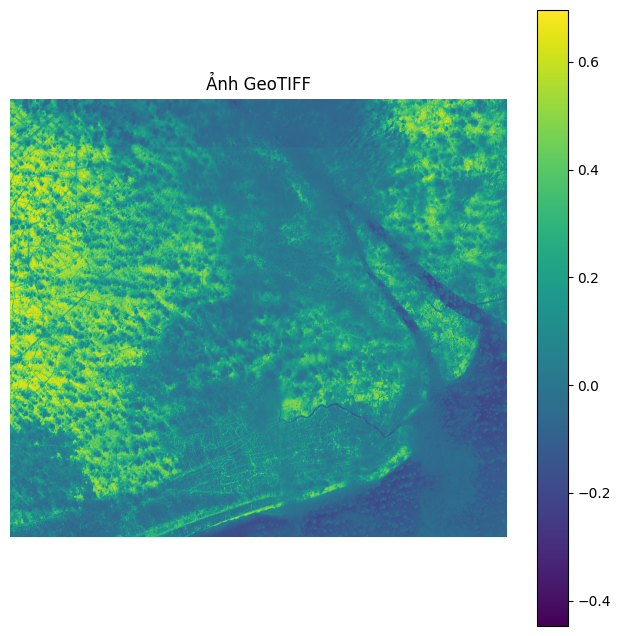

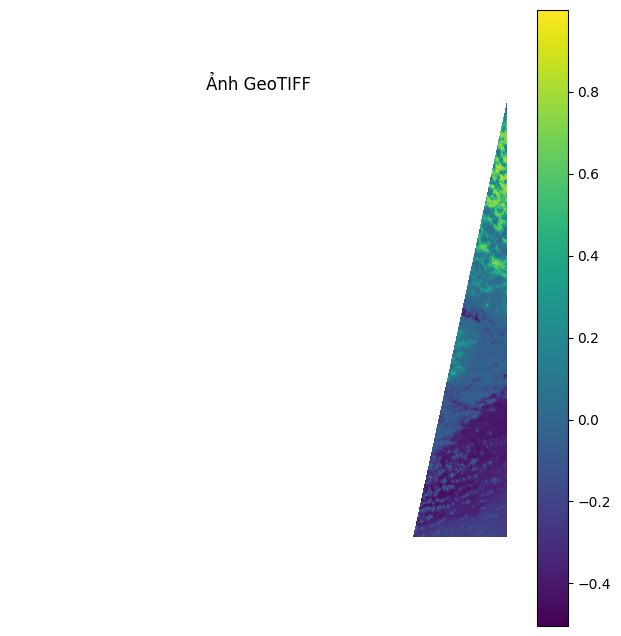

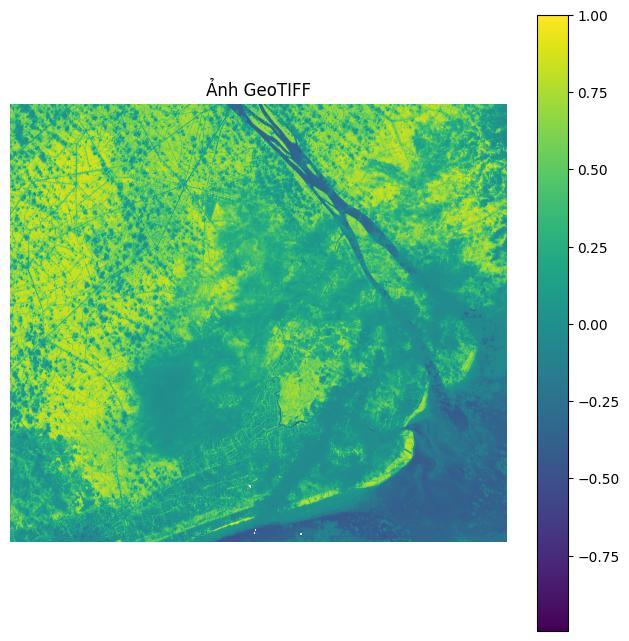

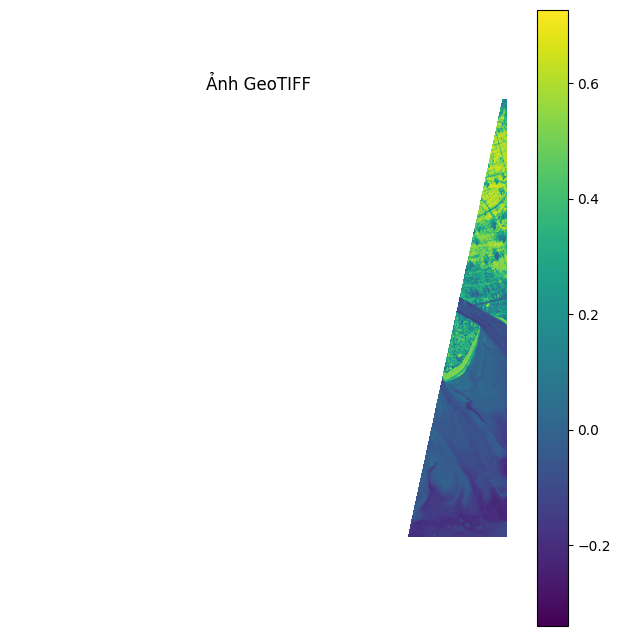

In [62]:
for i in path_tiff:
    src = rasterio.open(i)
    data = src.read(1)
    plt.figure(figsize=(8, 8))  # Tùy chỉnh kích thước hiển thị
    plt.imshow(data)  # Tùy chỉnh colormap (bảng màu)
    plt.colorbar()  # Hiển thị thanh màu
    plt.title("Ảnh GeoTIFF")  # Đặt tiêu đề cho ảnh
    plt.axis('off')  # Tắt trục x và y nếu bạn muốn

    # Hiển thị ảnh
    plt.show()

In [63]:
ds.data_vars

Data variables:
    red      (time, y, x) uint16 0 0 0 0 0 0 0 ... 1432 1471 1481 1428 1413 1407
    green    (time, y, x) uint16 0 0 0 0 0 0 0 ... 1826 1868 1915 1888 1844 1824
    blue     (time, y, x) uint16 0 0 0 0 0 0 0 ... 1697 1719 1740 1734 1687 1638
    nir      (time, y, x) uint16 0 0 0 0 0 0 0 ... 1140 1148 1171 1178 1156 1120
    NDVI     (time, y, x) float64 nan nan nan nan ... -0.09593 -0.1 -0.1136

In [66]:
product_name = "product_name"  # Tên sản phẩm ODC
x, y = 0, 0  # Tọa độ x, y (điểm trái trên cùng của ảnh)
width, height = ds.red.shape[1], ds.red.shape[2] # Chiều rộng và chiều cao của ảnh đầu ra
output_file = "output_geotiff.tif"  # Tên tệp GeoTIFF đầu ra

In [68]:
transform = from_origin(ds.coords['x'].values[0], ds.coords['y'].values[0], ds.affine.a, ds.affine.e)

In [73]:
with rasterio.open(
    output_file,
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=len(ds.data_vars),  # Số tầng dữ liệu
    dtype=str(ds.dtypes["red"]),
    crs=ds.crs,  # Thay thế với mã EPSG thích hợp
    transform=transform
) as dst:
    for i, var_name in enumerate(ds.data_vars):
        dst.write(ds[var_name][1].values, i + 1)

In [74]:
src = rasterio.open(output_file)

In [83]:
src.read(1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)